# Things I had to do in the terminal before being able to use this notebook


## Use conda to build Python env with osmnx as main so that not upto date version in dependancies used but workable for osmnx

conda config --prepend channels conda-forge

conda create -n ox --strict-channel-priority osmnx

## go into env
conda activate ox

## install other libs that are needed for visulization
conda install matplotlib
conda install numpy
conda install -c anaconda ipykernel

## makes conda env into a kernel which then can be used by jupyter notebook
python -m ipykernel install --user --name=ox

## other Tool for queries to OpenStreetMap in testing phase
pip install OSMPythonTools


In [1]:
import osmnx as ox
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gd
%matplotlib inline

In [2]:
place_name = "Linsengericht, Main-Kinzig-Kreis, Hessen, 63589, Germany"

In [3]:
# Specify the name that is used to seach for the data


# Fetch OSM street network from the location
graph = ox.graph_from_place(place_name)


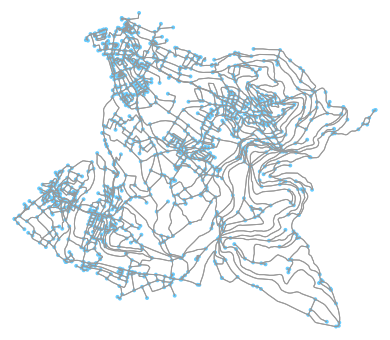

In [4]:
# Plot the streets
fig, ax = ox.plot_graph(graph)


Link for amenities:
https://wiki.openstreetmap.org/wiki/Key:amenity#Healthcare

In [5]:
#new query for all buildings in place of interest data similar but not identical...
buildings = ox.footprints_from_place(place_name)
#bos = buildings[buildings['amenity'].isin(buildings_of_interest)]
#separation to get all shops for nicer visualization
shop = buildings[buildings['shop'].notnull()]


In [6]:
col_names=['amenity','shop','building','leisure', 'sport', 'office']
list_cols=[]
for x in col_names:
    try:
        blup = buildings[buildings[x].notnull()]
        if isinstance(blup[x].iloc[0], list ) | isinstance(blup[x].iloc[0], dict ):
            continue
        print(str(x)+' = '+str(list(blup[x].unique())))
        list_cols.append(x)
    except:
        continue
print(list_cols)

amenity = ['bank', 'school', 'place_of_worship', 'townhall', 'public_building', 'kindergarten', 'restaurant', 'doctors', 'veterinary', 'car_wash', 'fire_station', 'pub']
shop = ['supermarket', 'beverages', 'car', 'signs', 'laundry', 'shoes', 'butcher', 'frame', 'florist']
building = ['yes', 'supermarket', 'office', 'church', 'roof', 'public', 'warehouse', 'retail', 'commercial', 'house', 'barn', 'industrial', 'residential', 'garage', 'cabin', 'terrace', 'school', 'shed', 'garages', 'service', 'construction', 'silo']
leisure = ['sports_centre', 'pitch']
sport = ['multi', 'tennis', 'soccer', 'shooting']
office = ['company']
['amenity', 'shop', 'building', 'leisure', 'sport', 'office']


In [7]:
#make geopandas of place of interest
#whole area
area = ox.gdf_from_place(place_name)
#basically all the ways one can move on !!BEWARE!! to my knowledge also not streets
nodes, edges = ox.graph_to_gdfs(graph)


In [8]:
#extra just for hospitals for nicer visulisation
healthcare = ['baby_hatch',
             'clinic',
             'dentist',
             'doctors',
             'hospital',
             'nursing_home',
             'pharmacy',
             'social_facility',
             'veterinary']
boish = ox.pois_from_place(place_name, amenities=healthcare)
#boisr = ox.pois_from_place(place_name, shop=)

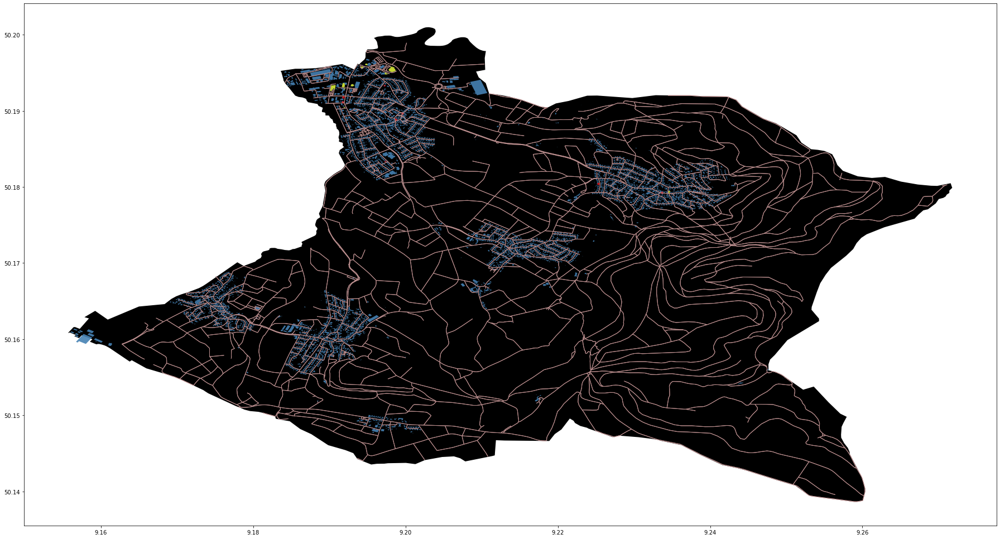

In [9]:
fig, ax = plt.subplots(figsize=(25,16))

# Plot the footprint
area.plot(ax=ax, facecolor='black')

# Plot street edges
edges.plot(ax=ax, linewidth=1, edgecolor='#BC8F8F')

# Plot buildings of interest and shops
buildings.plot(ax=ax, facecolor='steelblue', alpha=0.9)
shop.plot(ax=ax, facecolor='yellow', alpha=0.7)

# Plot healthcare
boish.plot(ax=ax, color='red', alpha=0.7, markersize=10)

plt.tight_layout()


In [10]:
boish

,osmid,geometry,addr:city,addr:housenumber,addr:postcode,addr:street,addr:suburb,amenity,dispensing,name,...,operator,website,phone,healthcare:speciality,specialty,level,email,nodes,addr:country,building
352680209,352680209,POINT (9.19172 50.19117),Linsengericht,2,63589,Odenwaldstraße,Altenhaßlau,pharmacy,yes,Wildhaus Apotheke,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
444436581,444436581,POINT (9.22528 50.18042),Linsengericht,8,63589,Fernblick,Eidengesäß,dentist,NaN,Dr. Irmtraud Eckl,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
455713727,455713727,POINT (9.19872 50.18887),Linsengericht,24,63589,Hauptstraße,Altenhaßlau,dentist,NaN,Dr. Berthold Graml,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
455713730,455713730,POINT (9.19179 50.19182),Linsengericht,1,63589,Vogelsbergstraße,Altenhaßlau,dentist,NaN,Dr. Hans-Joachim Rüger,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
469734408,469734408,POINT (9.23364 50.17930),Linsengericht,33,63589,Dorfstraße,Eidengesäß,pharmacy,yes,Johannis Apotheke,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6854844797,6854844797,POINT (9.19958 50.18967),NaN,NaN,NaN,NaN,NaN,doctors,NaN,HNO-Zentrum,...,NaN,NaN,NaN,otolaryngology,NaN,NaN,NaN,NaN,NaN,NaN
144574264,144574264,"POLYGON ((9.19723 50.19342, 9.19717 50.19335, ...",Linsengericht,3,63589,Hasselhofstraße,Altenhaßlau,doctors,NaN,"Dr. Adam, Dr. Gazali",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[1581192767, 1581192419, 1581192416, 158119222...",NaN,yes
144639767,144639767,"POLYGON ((9.19726 50.18339, 9.19722 50.18338, ...",Linsengericht,8,63589,Brentanostraße,Altenhaßlau,veterinary,NaN,Dr. Manfred Nick,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[1581626071, 1581626062, 1581626059, 158162604...",NaN,yes


In [11]:
ox.pd.set_option('display.max_rows', None)

In [12]:
buildings

,nodes,addr:city,addr:housenumber,addr:postcode,addr:street,building,leisure,name,sport,wheelchair,...,beds,description,outdoor_seating,rooms,tourism,disused:tourism,fixme,entrance,members,type
42276303,"[527338303, 1720831684, 1720831683, 1720831662...",Linsengericht,27,63589,Spessartstraße,yes,sports_centre,TV Lützelhausen,multi,yes,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
92031680,"[1069128426, 1897266499, 1897266502, 189726650...",Linsengericht,1,63589,Kleinbahnweg,supermarket,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
92031681,"[1069128414, 1583902880, 1583902881, 158390286...",Linsengericht,11,63589,Stadtweg,supermarket,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
92155004,"[1069895876, 1601534981, 1601534975, 160153503...",Linsengericht,9,63589,Stadtweg,office,NaN,VR-Bank,NaN,yes,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
92155008,"[1069895891, 1069895832, 1577001217, 106989588...",Linsengericht,3,63589,Im Niederfeld,yes,sports_centre,Sporttreff Kinzigtal,tennis,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
93865985,"[1091095536, 1583902899, 1091095463, 109109526...",Linsengericht,3,63589,Kleinbahnweg,supermarket,NaN,tegut...,NaN,yes,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
93865987,"[1091095409, 1091095506, 1091095474, 109109556...",Linsengericht,3,63589,Kleinbahnweg,supermarket,NaN,tegut... Getränkemarkt,NaN,yes,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
94102956,"[1093987802, 1583961142, 1583961137, 158396113...",Linsengericht,3,63589,Lagerhausstraße,yes,NaN,Freie Montessorischule,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
111182946,"[1267362861, 1267362853, 1782568453, 178256845...",NaN,NaN,NaN,NaN,yes,sports_centre,Sportheim Geislitz,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
111183533,"[1267367217, 1267367226, 1267367228, 126736722...",NaN,NaN,NaN,NaN,yes,sports_centre,Sportheim Eidengesäß,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
#buildings.loc[buildings['building']=='detached']

In [14]:
#bois2 = buildings.loc[:, ['amenity','shop','geometry','nodes']]


In [15]:
#for x in bois2.index:
#    bois2.loc[x]

In [16]:
#buildings = ox.footprints_from_place(place_name)
#shop = buildings[buildings['shop'].notnull()]

In [17]:
#idea check to see if ox.pois_from_place(place_name, amenities=buildings_of_interest) and ox.footprints_from_place(place_name) 
#do the same not finished but they are not, for Wedding!
bos = buildings[buildings['building'].isin(['construction'])]
bos

,nodes,addr:city,addr:housenumber,addr:postcode,addr:street,building,leisure,name,sport,wheelchair,...,beds,description,outdoor_seating,rooms,tourism,disused:tourism,fixme,entrance,members,type
505235300,"[4952201343, 4952201339, 4952201338, 495220133...",NaN,NaN,NaN,NaN,construction,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [18]:
col_names=['amenity','shop','building','leisure', 'sport', 'office']
list_cols=[]
for x in col_names:
    try:
        blup = buildings[buildings[x].notnull()]
        if isinstance(blup[x].iloc[0], list ) | isinstance(blup[x].iloc[0], dict ):
            continue
        print(str(x)+' = '+str(list(blup[x].unique())))
        list_cols.append(x)
    except:
        continue
print(list_cols)

amenity = ['bank', 'school', 'place_of_worship', 'townhall', 'public_building', 'kindergarten', 'restaurant', 'doctors', 'veterinary', 'car_wash', 'fire_station', 'pub']
shop = ['supermarket', 'beverages', 'car', 'signs', 'laundry', 'shoes', 'butcher', 'frame', 'florist']
building = ['yes', 'supermarket', 'office', 'church', 'roof', 'public', 'warehouse', 'retail', 'commercial', 'house', 'barn', 'industrial', 'residential', 'garage', 'cabin', 'terrace', 'school', 'shed', 'garages', 'service', 'construction', 'silo']
leisure = ['sports_centre', 'pitch']
sport = ['multi', 'tennis', 'soccer', 'shooting']
office = ['company']
['amenity', 'shop', 'building', 'leisure', 'sport', 'office']


In [24]:
def assign_location_classifier(df_buildings):
        '''Build reference lists for assign_building_type() from given dataframe.
        Should be produced by read_geodata.py.
        Possible classes and therefore dictionary keys are:
        'excluded_buildings' = buildings not included because they do not fit any class
        'hospital' = hospitals
        'work' = anything a person can work at
        'public' = right now religous and sport buildings #FIXME-Discussion: restaurantes, bars, cafe?
        'school' = places with a lot of young people
        Sorting idea as of right now everything is work place if not in any other list
        : return: location class dictionary loc_class_dic['school'] = ['school','university','kindergarten']

        '''
        loc_class_dic = {}

        loc_class_dic['excluded_buildings'] = ['garage', 'roof', 'shed', 'bungalow', 'barn', 'silo']
        loc_class_dic['hospital'] = ['hospital']
        loc_class_dic['morgue'] = ['morgue','funeral_hall']
        loc_class_dic['mixing_loc'] = ['mixing_loc']
        
        
        cols = ['amenity', 'shop', 'leisure', 'sport','building']
        for col in cols:
            try:
                list(df_buildings[col].unique())
            except:
                buildings[col] = [np.nan]*len(buildings)
    
        loc_class_dic['work'] = ['office','warehouse', 'industrial',  'construction']\
            + list(df_buildings['amenity'].unique())\
            + list(df_buildings['shop'].unique())

        # What is a public place or just work place e.g. restaurante, cafe...

        loc_class_dic['public'] = ['public', 'service','cabin', 'chapel', 'church', 'train_station', 'parish_hall', 'townhall','supermarket',
                                   'restaurant', 'grocery_store', 'cafe', 'sports_centre']\
            + list(df_buildings['leisure'].unique())\
            + list(df_buildings['sport'].unique())

        loc_class_dic['school'] = ['school', 'university', 'kindergarten']
        # Cleaning the list public place of nan
        loc_class_dic['public'] = [x for x in loc_class_dic['public'] if ~pd.isnull(x)]
        # Removing values from workplace_list that are in work place and in another list
        for x in loc_class_dic['hospital'] + [np.nan] + loc_class_dic['public'] + loc_class_dic['school']:
            while x in loc_class_dic['work']:
                loc_class_dic['work'].remove(x)

        return loc_class_dic

def assign_building_type(building_lst: list, loc_class_dic: dict):
    '''set building type according to value in building_lst and where it matches with reference lists

        : return: string with building type
    '''
    # auto assign is home
    building_type = 'home'
    # if any entry of building_lst matches any location class entry: it is assigned to that class
    for key in loc_class_dic:
        if any(elem in loc_class_dic[key] for elem in building_lst):
            building_type = key

    return building_type

In [25]:
loc_class_dic = assign_location_classifier(buildings)
buildings['building_type']= buildings.apply(lambda row: assign_building_type(row[col_names].dropna().unique(), loc_class_dic), axis = 1) 

In [26]:
buildings['building_type'].count()

6572

In [22]:
import matplotlib.cm as cm 

/home/maxim/anaconda3/envs/ox/lib/python3.8/site-packages/geopandas/plotting.py:529: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
/home/maxim/anaconda3/envs/ox/lib/python3.8/site-packages/geopandas/plotting.py:529: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
No handles with labels found to put in legend.


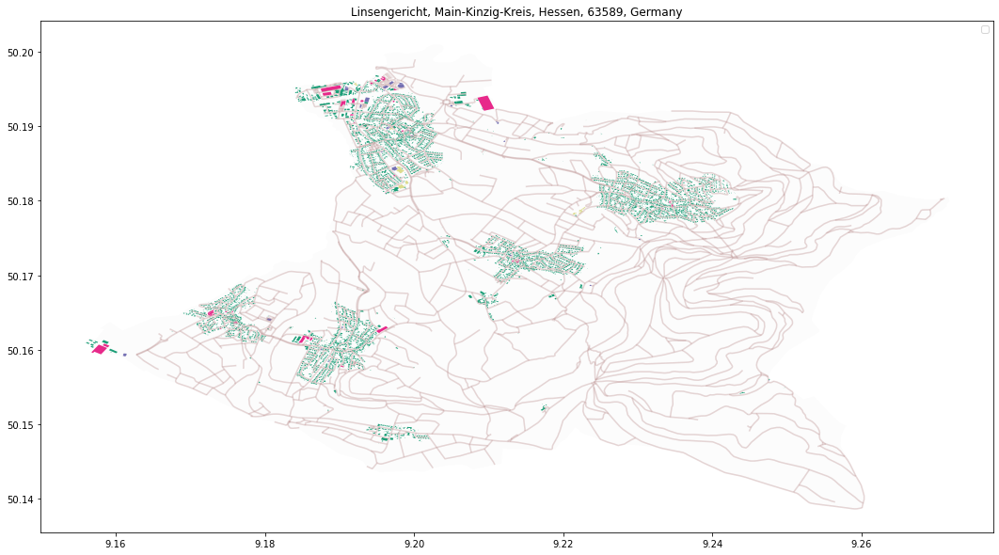

In [27]:
locationsCmap1 = cm.get_cmap('Dark2')  # for our locations
locationsCmap2 = cm.get_cmap('tab20')
locationTypeColors = {
    'home': locationsCmap1(0),  # aquamarine
    'public': locationsCmap1(2),  # purple-blue
    'work': locationsCmap1(3),  # deep pink
    'hospital': locationsCmap1(5),  # mustard yellow
    'school': locationsCmap2(17),  # olive green - khaki
    'morgue': locationsCmap1(7)  # gray
}
plotrange=0.02
neighbourhood = 3
print()


fig, ax = plt.subplots(figsize=(25,10))
ax = plt.subplot()
cmap = cm.get_cmap('Dark2')

area.plot(ax=ax, color='black' ,alpha=0.01)
edges.plot(ax=ax, color='#BC8F8F', alpha=0.2)

for building_type in locationTypeColors:
    buildings[buildings['building_type']==building_type].plot(ax=ax, color=locationTypeColors[building_type], label=building_type, legend=False,legend_kwds={'frameon':False, 'loc':'lower right'})
    #ax.text(max(buildings['building_coordinates_x']),max(buildings['building_coordinates_y']), 'H', c=locationsCmap1(5))
    #ax.text(min(buildings['building_coordinates_x']),min(buildings['building_coordinates_y']), 'M', c=locationsCmap1(7))
    #ax.set_label('s')
    #handles, labels = ax.get_legend_handles_labels()
    #plt.legend(handles=[building_type], loc='lower right')
plt.legend()
plt.title(place_name)
plt.savefig(place_name+'_location_type_map.png', dpi=600)
#plt.legend()    
#ax.set_xlim(list_of_neighbourhood_centers[neighbourhood].x-plotrange,list_of_neighbourhood_centers[neighbourhood].x+plotrange)
#ax.set_ylim(list_of_neighbourhood_centers[neighbourhood].y-plotrange,list_of_neighbourhood_centers[neighbourhood].y+plotrange)